In [1]:
import pandas as pd
import numpy as np

In [2]:
import os
path="/Users/jesperdybkjaer/Documents/DTU/Kandidat/4.semester/3_SocialDataanalysisAndVisualization/Final_project"
os.chdir(path)

In [3]:
# import the data
df = pd.read_csv("DataTransformed.csv")

Get the x and y values in seperate columns for all trees, and creating a geometry point (wkb_geometry is a string).

In [4]:
import math
from ast import literal_eval
def merc(X,Y):
    #Coordinates = literal_eval(Coords)
    lat = Y
    lon = X
    
    r_major = 6378137.000
    x = r_major * math.radians(lon)
    scale = x/lon
    y = 180.0/math.pi * math.log(math.tan(math.pi/4.0 + 
        lat * (math.pi/180.0)/2.0)) * scale
    return (x, y)

In [5]:
# Import geopandas package
import geopandas as gpd

df['X']=np.zeros(len(df))
df['Y']=np.zeros(len(df))
df['X_merc']=np.zeros(len(df))
df['Y_merc']=np.zeros(len(df))

for i in range(len(df)):
    temp = df['wkb_geometry'][i].split()
    df['X'][i]=float(temp[1][1:])
    df['Y'][i]=float(temp[2][:-1])
    
    temp1 = merc(df['X'][i],df['Y'][i])
    df['X_merc'][i] = temp1[0]
    df['Y_merc'][i] = temp1[1]

##Creating a geometry point of our data
df = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.X,df.Y))


/Users/jesperdybkjaer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/Users/jesperdybkjaer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/Users/jesperdybkjaer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

In [6]:
### Sort the data the same way as Andreas
#Drop the city names which are not given
#print(f'Dataset with all observations: {df.shape}')

#df_type = df[df.slaegtsnavn.notna()]
#print(f'Dataset with slaegtsnavn: {df_type.shape}')

#df_neighbourhood = df[df.bydelsnavn.notna()]
#print(f'Dataset with neighbourhood: {df_neighbourhood.shape}')

#Drop the tree names which are not given

#df_withtype = df[df.slaegtsnavn.notna()]
#print(f'Dataset with treetype: {df_withtype.shape}')

#Remove the non registred trees so it is nicer to look at

#df_withtype = df_withtype[df_withtype['slaegtsnavn'] != 'Ikke registreret']

# Map with bokeh
Inspirations from:
https://towardsdatascience.com/walkthrough-mapping-basics-with-bokeh-and-geopandas-in-python-43f40aa5b7e9

Dashboard/on page:
https://towardsdatascience.com/https-medium-com-radecicdario-next-level-data-visualization-dashboard-app-with-bokeh-flask-c588c9398f98

In [7]:
#import main Python libaries
import numpy as np
import pandas as pd
import shapefile as shp
import matplotlib.pyplot as plt
import seaborn as sns
import urllib.request

#initialize visualization setup
sns.set(style='whitegrid', palette='pastel', color_codes=True)
sns.mpl.rc('figure', figsize=(10,6))
%matplotlib inline

### Shapefiles of Copenhagen neighbourhoods

Import the shape files of copenhagen.

In [8]:
import urllib, geojson, gdal, subprocess

# Import shapefile from github:
# https://github.com/codeforamerica/click_that_hood/blob/master/public/data/copenhagen.geojson
url = 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/copenhagen.geojson'
response = urllib.request.urlopen(url)
data = geojson.loads(response.read())

with open('data.geojson', 'w', encoding='utf-8') as f:
    geojson.dump(data, f)
    
    
args = ['ogr2ogr', '-f', 'ESRI Shapefile', 'destination_data.shp', 'data.geojson']
subprocess.Popen(args);

In [9]:
# Import geopandas package
import geopandas as gpd

# Read in shapefile and examine data
df_cph = gpd.read_file('destination_data.shp')
df_cph = df_cph.drop(['id','cartodb_id','created_at','updated_at'],axis=1)
df_cph=df_cph.rename(columns={'name':'district'})
df_cph['district'][3]='Vesterbro'
df_cph

/Users/jesperdybkjaer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,bydel_nr,district,geometry
0,1,Indre By,"POLYGON ((12.61149 55.69763, 12.61534 55.69783..."
1,2,Østerbro,"POLYGON ((12.61591 55.72065, 12.62000 55.72348..."
2,5,Valby,"POLYGON ((12.52434 55.66666, 12.52449 55.66668..."
3,4,Vesterbro,"POLYGON ((12.54446 55.64038, 12.54446 55.64038..."
4,9,Amager Øst,"POLYGON ((12.63094 55.67050, 12.63126 55.67028..."
5,7,Brønshøj-Husum,"POLYGON ((12.46894 55.69976, 12.46698 55.70024..."
6,3,Nørrebro,"POLYGON ((12.56165 55.69667, 12.56152 55.69636..."
7,8,Bispebjerg,"POLYGON ((12.51594 55.70664, 12.51539 55.70693..."
8,6,Vanløse,"POLYGON ((12.46894 55.69976, 12.46935 55.69965..."
9,10,Amager Vest,"POLYGON ((12.58271 55.66850, 12.58661 55.66783..."


In [10]:
# Create dataframe with sum of trees in different neigbourhoods
df_tree_sum=df.groupby('bydelsnavn')['id'].count()
df_tree_sum=pd.DataFrame(df_tree_sum,columns=['id'])
df_tree_sum=df_tree_sum.rename(columns={'id':'tree_sum'})
p_tree = df_tree_sum['tree_sum']/sum(df_tree_sum['tree_sum'])*100
df_tree_sum['p_tree']=p_tree

## Befolkning pr. 31 jan 2019: https://statistikbanken.kk.dk/1050dc07-e88c-4206-ae4e-645718e26ab9/ReportSection
district1 = ['Indre By', 'Østerbro','Nørrebro','Vesterbro','Valby','Vanløse',
        'Brønshøj-Husum','Bispebjerg','Amager Øst','Amager Vest']
population = [55866,79803,80254,72688,60308,41195,44784,55172,59803,78973]
p_population = np.array(population)/sum(population)*100
temp1 = pd.DataFrame({'district':district1,'population':population,'p_population':p_population})

# Area of neighbourhoods
district3 = ['Indre By','Østerbro','Nørrebro','Vesterbro','Valby',
            'Vanløse','Brønshøj-Husum','Bispebjerg','Amager Øst','Amager Vest']
area = [9,8.7,4.1,8.2,9.2,6.7,8.7,6.8,9.1,19.2] # area in km^2
p_area = np.array(area)/sum(area)*100
temp3 = pd.DataFrame({'district':district3,'area':area,'p_area':p_area})

# Merge the dataframes together
df_cph=df_cph.merge(df_tree_sum,left_on='district',right_on=df_tree_sum.index)
df_cph=df_cph.merge(temp1,left_on='district',right_on='district')
df_cph=df_cph.merge(temp3,left_on='district',right_on='district')

# Adding the center coordinates of the districts
for i in range(len(df_cph)):
    center_X= df_cph['geometry'][i].centroid.coords[0][0]
    center_Y= df_cph['geometry'][i].centroid.coords[0][1]
df_cph['center_X'] = center_X
df_cph['center_Y'] = center_Y

df_cph

,bydel_nr,district,geometry,tree_sum,p_tree,population,p_population,area,p_area,center_X,center_Y
0,1,Indre By,"POLYGON ((12.61149 55.69763, 12.61534 55.69783...",6105,10.707521,55866,8.883892,9.0,10.033445,12.572175,55.638694
1,2,Østerbro,"POLYGON ((12.61591 55.72065, 12.62000 55.72348...",7815,13.706679,79803,12.690388,8.7,9.698997,12.572175,55.638694
2,5,Valby,"POLYGON ((12.52434 55.66666, 12.52449 55.66668...",4878,8.555493,60308,9.590265,9.2,10.256410,12.572175,55.638694
3,4,Vesterbro,"POLYGON ((12.54446 55.64038, 12.54446 55.64038...",6710,11.768626,72688,11.558951,8.2,9.141583,12.572175,55.638694
4,9,Amager Øst,"POLYGON ((12.63094 55.67050, 12.63126 55.67028...",3930,6.892802,59803,9.509960,9.1,10.144928,12.572175,55.638694
5,7,Brønshøj-Husum,"POLYGON ((12.46894 55.69976, 12.46698 55.70024...",4149,7.276905,44784,7.121616,8.7,9.698997,12.572175,55.638694
6,3,Nørrebro,"POLYGON ((12.56165 55.69667, 12.56152 55.69636...",6769,11.872106,80254,12.762107,4.1,4.570792,12.572175,55.638694
7,8,Bispebjerg,"POLYGON ((12.51594 55.70664, 12.51539 55.70693...",8268,14.501193,55172,8.773531,6.8,7.580825,12.572175,55.638694
8,6,Vanløse,"POLYGON ((12.46894 55.69976, 12.46935 55.69965...",3915,6.866494,41195,6.550888,6.7,7.469342,12.572175,55.638694
9,10,Amager Vest,"POLYGON ((12.58271 55.66850, 12.58661 55.66783...",4477,7.852182,78973,12.558401,19.2,21.404682,12.572175,55.638694


We can now convert the data of the districts to a format that is conducive to mapping.

In [11]:
import json
from bokeh.io import show
from bokeh.models import (CDSView, ColorBar, ColumnDataSource,
                          CustomJS, CustomJSFilter, 
                          GeoJSONDataSource, HoverTool,
                          LinearColorMapper, Slider)
from bokeh.layouts import column, row, widgetbox
from bokeh.palettes import brewer
from bokeh.plotting import figure

In [12]:
# Input GeoJSON source that contains features for plotting
#geosource = GeoJSONDataSource(geojson = df2.to_json(default_handler=str)) # If it print this a error try use this
geosource = GeoJSONDataSource(geojson = df_cph.to_json())

Correct format, now ready to plot in Bokeh.

In [13]:
from bokeh.io import push_notebook, show, output_notebook
from bokeh.layouts import row
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, ranges, Legend, Label, LabelSet
from bokeh.models.ranges import FactorRange

#from bokeh.models import ColumnDataSource, Label, LabelSet, Range1d

output_notebook()

Loading BokehJS ...

Define the colorbar for number of trees for all bokeh maps

In [14]:
# Define color palettes
palette = brewer['BuGn'][8]
palette = palette[::-1] # reverse order of colors so higher values have darker colors

# Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
color_mapper = LinearColorMapper(palette = palette, low = 0, high = 9000)

# Define custom tick labels for color bar.
tick_labels = {'0': '0', '1000': '1000',
 '2000':'2000', '3000':'3000',
 '4000':'4000', '5000':'5000','6000':'6000','7000':'7000','8000':'8000','9000':'9000'}

# Create color bar.
color_bar = ColorBar(color_mapper = color_mapper, 
                     label_standoff = 8,
                     width = 750, height = 20,
                     border_line_color = None,
                     location = (0,0), 
                     orientation = 'horizontal',
                     major_label_overrides = tick_labels,
                     title = 'Amount of trees in district')
                    

# First map on webpage

In [44]:
# Create figure object.
p = figure(title = 'Trees in the Copenhagen municipality',
           title_location = 'above',
           plot_height = 800 ,
           plot_width = 800, 
           toolbar_location = 'above',
           tools = 'pan, wheel_zoom, box_zoom, reset',
           aspect_scale=0.05)

# Change font size on title
p.title.text_font_size = '20pt'

p.axis.visible = False
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# Add patch renderer to figure.
neighbourhoods = p.patches('xs','ys', source = geosource,
                   fill_color = {'field' :'tree_sum',
                                 'transform' : color_mapper},
                   line_color = 'black', 
                   line_width = 0.75, 
                   fill_alpha = 1)

# Create hover tool
p.add_tools(HoverTool(renderers = [neighbourhoods],
                      tooltips = [('Neighbourhood','@district'),
                                ('Trees','@tree_sum (@p_tree{0.0}%)'),
                                 ('Population',' @population (@p_population{0.0}%)'),
                                 ('Area [km^2]','@area{0.0} (@p_area{0.0}%)')]))

p.add_layout(color_bar, 'below')

p.toolbar.logo = None

# Remove the grey box around the plot
p.outline_line_color = None

show(p)

## We are now interested to add some trees

# Trees colored by type

## Generating the colors we want to use for our different tree types

In [74]:
from colorcet.plotting import swatch, swatches
import holoviews as hv
hv.extension('matplotlib')
import colorcet as cc

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

We have found the best colormap by inspecting different colormaps from the following website
- https://colorcet.holoviz.org/user_guide/index.html
The colorstrip you see printet below is the one that was chosen to be used:

:Image   [x,y]   (z)
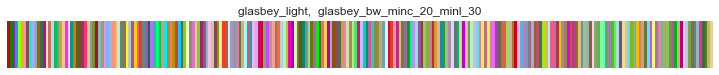

In [77]:
# One color example
swatch('glasbey_light')

It is wished to have the trees displayed by desending order, with the biggest tree groups first. See the order below.

In [80]:
# How to sort the slaegtsnavn_eng after amount of trees
#temp_group = df.groupby(['slaegtsnavn_eng']).size()
#temp_group=pd.DataFrame(temp_group)
#temp_group=temp_group.rename(columns={0:'Sum'})
#temp_group=temp_group.sort_values(by=['Sum'],ascending=False)
#temp_group.index

# It is resulting in the following order
focustrees = ['Not registered', 'Linden', 'Plane', 'Maple', 'Rowan', 'Cherry/Plum',
       'Ash', 'Oak', 'Black locust', 'Horse chestnut', 'Birch', 'Poplar',
       'Hawthorn', 'Apple', 'Hornbeam', 'Pine', 'Alderm', 'Willow', 'Alder',
       'Minority tree', 'Spruce', 'Honey locust', 'Hazel', 'Pear', 'Thuja',
       'Dawn redwood', 'Yew', 'Tree of heaven', 'Gingko', 'Beech',
       'Tulip tree', 'False cypress', 'Juneberry', 'Sweetgum', 'Chestnut',
       'Magnolia', 'Golden rain', 'Larch', 'Cedar', 'Walnut', 'Cornus']

In [94]:
palette = cc.glasbey_light[1:len(df['slaegtsnavn_eng'].unique())*2+1] # Best so far
dict_colors={}
list_colors=[]
for index,i in enumerate(focustrees):
    dict_colors[i]=palette[index*2]
    list_colors.append(palette[index*2])

By further inspecting it is found that the color for the ``Juneberry`` was insufficient (too white), therefor one ajustment were made to the colorlist before we were ready to plot them.   

In [97]:
dict_colors.update({'Juneberry':'#a77b87'})

In [110]:
list_colors

['#018700',
 '#05acc6',
 '#ffa52f',
 '#79525e',
 '#afa5ff',
 '#9a6900',
 '#d3008c',
 '#c86e66',
 '#00c846',
 '#b8ba01',
 '#ff28fd',
 '#009e7c',
 '#56642a',
 '#90318e',
 '#a0e491',
 '#829026',
 '#77c6ba',
 '#e48eff',
 '#c6a5c1',
 '#d3c37c',
 '#6b8567',
 '#f9ff00',
 '#ac567c',
 '#ff49b1',
 '#5d8c90',
 '#00753f',
 '#00d493',
 '#49a150',
 '#00ebed',
 '#f77589',
 '#c84248',
 '#755726',
 '#ebffd4',
 '#db72c8',
 '#8abf5d',
 '#855b89',
 '#ffbad6',
 '#97414d',
 '#fde1b1',
 '#80793d',
 '#a795c6']

# Neigbourhoods to correct UTM

In [ ]:
EPSG:25832

In [105]:
df_cph

,bydel_nr,district,geometry,tree_sum,p_tree,population,p_population,area,p_area,center_X,center_Y
0,1,Indre By,"POLYGON ((12.61149 55.69763, 12.61534 55.69783...",6105,10.707521,55866,8.883892,9.0,10.033445,12.572175,55.638694
1,2,Østerbro,"POLYGON ((12.61591 55.72065, 12.62000 55.72348...",7815,13.706679,79803,12.690388,8.7,9.698997,12.572175,55.638694
2,5,Valby,"POLYGON ((12.52434 55.66666, 12.52449 55.66668...",4878,8.555493,60308,9.590265,9.2,10.256410,12.572175,55.638694
3,4,Vesterbro,"POLYGON ((12.54446 55.64038, 12.54446 55.64038...",6710,11.768626,72688,11.558951,8.2,9.141583,12.572175,55.638694
4,9,Amager Øst,"POLYGON ((12.63094 55.67050, 12.63126 55.67028...",3930,6.892802,59803,9.509960,9.1,10.144928,12.572175,55.638694
5,7,Brønshøj-Husum,"POLYGON ((12.46894 55.69976, 12.46698 55.70024...",4149,7.276905,44784,7.121616,8.7,9.698997,12.572175,55.638694
6,3,Nørrebro,"POLYGON ((12.56165 55.69667, 12.56152 55.69636...",6769,11.872106,80254,12.762107,4.1,4.570792,12.572175,55.638694
7,8,Bispebjerg,"POLYGON ((12.51594 55.70664, 12.51539 55.70693...",8268,14.501193,55172,8.773531,6.8,7.580825,12.572175,55.638694
8,6,Vanløse,"POLYGON ((12.46894 55.69976, 12.46935 55.69965...",3915,6.866494,41195,6.550888,6.7,7.469342,12.572175,55.638694
9,10,Amager Vest,"POLYGON ((12.58271 55.66850, 12.58661 55.66783...",4477,7.852182,78973,12.558401,19.2,21.404682,12.572175,55.638694


In [109]:
geo_df_cph = gpd.GeoDataFrame(df_cph[['district']], geometry=df_cph['geometry'])
geo_df_cph.crs = {'init': 'epsg:25832'} 

In [ ]:
geosource = GeoJSONDataSource(geojson = df_cph.to_json())

In [ ]:
geo_df = gpd.GeoDataFrame(df[['id', 'population']], geometry=)
# Define crs for our geodataframe:
geo_df.crs = {'init': 'epsg:4326'} 

# Second map (ALL TREES)

Check colormap before using it:
> Before we can see which colormap we have selected we need to install the folowing. Here I'm using pip, but it can also be installed by conda:
>
>  * git clone git://github.com/pyviz/holoviews.git
>  * cd holoviews
>  * pip install -e .

In [23]:
# Dataframe without geometry, but with X and Y columns
temp=df.drop(['geometry','wkb_geometry'],axis=1)

In [47]:
p1.renderers = []

In [99]:
from bokeh.tile_providers import CARTODBPOSITRON, get_provider
import bokeh.models as bmo

# Set color palette for trees
#palette = cc.glasbey_light[1:len(df['slaegtsnavn_eng'].unique())*2+1] # Best so far
#palette = palette1


# Create figure object.
p1 = figure(title = 'Trees in Copenhagen (color correspond to tree type)', 
           plot_height = 700 ,
           plot_width = 1000, 
           toolbar_location = 'below',
           tools = 'pan, wheel_zoom, box_zoom, reset',
           aspect_scale=0.05,
           x_range=(1385927.66, 1409304.75), y_range=(7479195.60, 7506830.16),
           x_axis_type="mercator", y_axis_type="mercator")

# Plot the map of Copenhagen as our background
p1.add_tile(tile_provider)

# Change font size on title
p1.title.text_font_size = '20pt'

#p1.axis.visible = False
p1.xgrid.grid_line_color = None
p1.ygrid.grid_line_color = None

p1.min_border_top = 0
p1.min_border_bottom = 0

# Add patch renderer to figure.
p1.patches('xs','ys', source = geosource,
                   line_color = 'black', 
                   line_width = 3 
                   ,fill_alpha = 0.00)

# Create the circles with its hover
circle = {}
items=[]

for index,i in enumerate(focustrees):
    temp1=temp[temp['slaegtsnavn_eng']==i]
    treesource = ColumnDataSource(temp1)
    circle[i]= p1.circle(x='X_merc'
              ,y='Y_merc'
              ,source=treesource
              ,legend_label= i 
              ,color=dict_colors[i]
              ,radius=11
              ,line_alpha=0.8
              ,fill_alpha=0.1
              ,name='needshover')
    items.append((i,[circle[i]]))

    
p1.add_tools(HoverTool(names=['needshover']
                       ,tooltips = [('Neighbourhood','@bydelsnavn')
                                   ,('Tree type', '@slaegtsnavn_eng')
                                 ,('Location (Lat,Lon)', '(@Y,@X)')
                                 ,('Planting year','@planteaar{0}')]
                                  ))

# Remove the grey box around the plot
p1.outline_line_color = None

p1.toolbar.logo = None

legend1 = Legend(items=items[:21], location=(10, 60), click_policy="hide") 
legend2 = Legend(items=items[21:], location=(10, 83.5), click_policy="hide") 
                # assigns the click policy (you can try to use ''hide'

p1.legend.visible = False
p1.add_layout(legend1, 'right')
p1.add_layout(legend2, 'right')

# Specify layout
show(p1)

# Collect colors so plots uses the same colors

In [71]:
palette1=['#018700',
 '#05acc6',
 '#ffa52f',
 '#79525e',
 '#afa5ff',
 '#9a6900',
 '#d3008c',
 '#c86e66',
 '#00c846',
 '#b8ba01',
 '#ff28fd',
 '#009e7c',
 '#56642a',
 '#90318e',
 '#a0e491',
 '#829026',
 '#77c6ba',
 '#e48eff',
 '#c6a5c1',
 '#d3c37c',
 '#6b8567',
 '#f9ff00',
 '#ac567c',
 '#ff49b1',
 '#5d8c90',
 '#00753f',
 '#00d493',
 '#49a150',
 '#00ebed',
 '#f77589',
 '#c84248',
 '#755726',
 '#a77b87',
 '#db72c8',
 '#8abf5d',
 '#855b89',
 '#ffbad6',
 '#97414d',
 '#fde1b1',
 '#80793d',
 '#a795c6']

In [ ]:
'#a77b87'

In [70]:
list_with_colors_Andreas=[] 
list_for_me=[]
for key in sorted(colors_for_andreas):
#    print('%s: %s'%(key, colors_for_andreas[key]))
    list_with_colors_Andreas.append(colors_for_andreas[key])

    
for key in colors_for_andreas:
#    print('%s: %s'%(key, colors_for_andreas[key]))
    list_for_me.append(colors_for_andreas[key])
    
print('\n LIST WITH COLORS:')
#list_with_colors_Andreas
list_for_me


 LIST WITH COLORS:


['#018700',
 '#05acc6',
 '#ffa52f',
 '#79525e',
 '#afa5ff',
 '#9a6900',
 '#d3008c',
 '#c86e66',
 '#00c846',
 '#b8ba01',
 '#ff28fd',
 '#009e7c',
 '#56642a',
 '#90318e',
 '#a0e491',
 '#829026',
 '#77c6ba',
 '#e48eff',
 '#c6a5c1',
 '#d3c37c',
 '#6b8567',
 '#f9ff00',
 '#ac567c',
 '#ff49b1',
 '#5d8c90',
 '#00753f',
 '#00d493',
 '#49a150',
 '#00ebed',
 '#f77589',
 '#c84248',
 '#755726',
 '#ebffd4',
 '#db72c8',
 '#8abf5d',
 '#855b89',
 '#ffbad6',
 '#97414d',
 '#fde1b1',
 '#80793d',
 '#a795c6']

In [55]:
colors_for_andreas

{'Not registered': '#018700',
 'Linden': '#05acc6',
 'Plane': '#ffa52f',
 'Maple': '#79525e',
 'Rowan': '#afa5ff',
 'Cherry/Plum': '#9a6900',
 'Ash': '#d3008c',
 'Oak': '#c86e66',
 'Black locust': '#00c846',
 'Horse chestnut': '#b8ba01',
 'Birch': '#ff28fd',
 'Poplar': '#009e7c',
 'Hawthorn': '#56642a',
 'Apple': '#90318e',
 'Hornbeam': '#a0e491',
 'Pine': '#829026',
 'Alderm': '#77c6ba',
 'Willow': '#e48eff',
 'Alder': '#c6a5c1',
 'Minority tree': '#d3c37c',
 'Spruce': '#6b8567',
 'Honey locust': '#f9ff00',
 'Hazel': '#ac567c',
 'Pear': '#ff49b1',
 'Thuja': '#5d8c90',
 'Dawn redwood': '#00753f',
 'Yew': '#00d493',
 'Tree of heaven': '#49a150',
 'Gingko': '#00ebed',
 'Beech': '#f77589',
 'Tulip tree': '#c84248',
 'False cypress': '#755726',
 'Juneberry': '#ebffd4',
 'Sweetgum': '#db72c8',
 'Chestnut': '#8abf5d',
 'Magnolia': '#855b89',
 'Golden rain': '#ffbad6',
 'Larch': '#97414d',
 'Cedar': '#fde1b1',
 'Walnut': '#80793d',
 'Cornus': '#a795c6'}

In [56]:
palette

['#018700',
 '#b500ff',
 '#05acc6',
 '#97ff00',
 '#ffa52f',
 '#ff8ec8',
 '#79525e',
 '#00fdcf',
 '#afa5ff',
 '#93ac83',
 '#9a6900',
 '#366962',
 '#d3008c',
 '#fdf490',
 '#c86e66',
 '#9ee2ff',
 '#00c846',
 '#a877ac',
 '#b8ba01',
 '#f4bfb1',
 '#ff28fd',
 '#f2cdff',
 '#009e7c',
 '#ff6200',
 '#56642a',
 '#953f1f',
 '#90318e',
 '#ff3464',
 '#a0e491',
 '#8c9ab1',
 '#829026',
 '#ae083f',
 '#77c6ba',
 '#bc9157',
 '#e48eff',
 '#72b8ff',
 '#c6a5c1',
 '#ff9070',
 '#d3c37c',
 '#bceddb',
 '#6b8567',
 '#916e56',
 '#f9ff00',
 '#bac1df',
 '#ac567c',
 '#ffcd03',
 '#ff49b1',
 '#c15603',
 '#5d8c90',
 '#c144bc',
 '#00753f',
 '#ba6efd',
 '#00d493',
 '#00ff75',
 '#49a150',
 '#cc9790',
 '#00ebed',
 '#db7e01',
 '#f77589',
 '#b89500',
 '#c84248',
 '#00cff9',
 '#755726',
 '#85d401',
 '#ebffd4',
 '#a77b87',
 '#db72c8',
 '#cae256',
 '#8abf5d',
 '#a1216b',
 '#855b89',
 '#89bacf',
 '#ffbad6',
 '#b6cfaa',
 '#97414d',
 '#67aa00',
 '#fde1b1',
 '#ff3628',
 '#80793d',
 '#d6e8ff',
 '#a795c6',
 '#7ea59a']

# Most lonely tree

A function is created below to find the tree that is the most lonely.

In [ ]:
def dist_point(X,Y):
    #Point(0,0).distance(Point(1,1))
    
    alltimebest = 0
    for X_iP1,Y_iP1 in zip(enumerate(X),enumerate(Y)):
        nearest = 100000
        #print('New: ',indexP1)
        for X_iP2,Y_iP2 in zip(enumerate(X),enumerate(Y)):
            if X_iP1[0] != X_iP2[0]:
                angle1,angle2,distance = geod.inv(X_iP1[1], Y_iP1[1],X_iP2[1], Y_iP2[1])
                if distance < nearest:
                    nearest = distance
                    index_nearest = X_iP2[0]
                    #print(f'update: {nearest}')
                if alltimebest > nearest:
                    break
        if nearest > alltimebest:
            alltimebest = nearest
            #print(indexP1,' ', index_nearest)
            #print(f'AllBest: {alltimebest}')
            index_trees = [X.index[X_iP1[0]],X.index[index_nearest]]
    return alltimebest,index_trees

To find the distance in meters we need to do the following calculation with the package pyproj.

In [ ]:
# TEST SIZE, the loneliest tree is placed on Amager Vest
#a=df[df['bydelsnavn']=='Amager Vest']
#len(a.geometry)

In [ ]:
#alltimebest, index_trees = dist_point(df.geometry)

import time
#Calculating the distance to nearest neighbour tree

start_time = time.time()
alltimebest,index_trees = dist_point(df.X,df.Y)
print("--- %s seconds ---" % (time.time() - start_time))
print(alltimebest,index_trees)

The distance between the most lonely tree and its nearest neighbour can be calculated in meters.

In [ ]:
import pyproj
geod = pyproj.Geod(ellps='WGS84')

# THE TREE WITH THE LONGEST DISTANCE TO ITS NEAREST NEIGHBOUR.
# 231.3869 meter, [16607, 16602]
#  IT TOOK --- 3082 seconds --- APPR. 50 MINUTES
angle1,angle2,distance = geod.inv(df.X[16607], df.Y[16607],df.X[16602], df.Y[16602])
print('Tree with index 16607, has {0:8.4f} meters to nearest neighbour.'.format(distance))

And plotted as well.

In [ ]:
# Create figure object.
pL = figure(title = 'Trees in Copenhagen neighbourhoods', 
           plot_height = 900 ,
           plot_width = 900, 
           toolbar_location = 'below',
           tools = 'pan, wheel_zoom, box_zoom, reset',
           match_aspect=True)

pL.axis.visible = False
pL.xgrid.grid_line_color = None
pL.ygrid.grid_line_color = None

# Add patch renderer to figure.
neighbourhoods = pL.patches('xs','ys', source = geosource,
                   line_color = 'black', 
                   line_width = 3, 
                   fill_alpha = 0.1)

# Draw the coordinates as circles
pL.circle(x=df['X'], y=df['Y'],
           color='red', size=1, alpha=0.9)
# Draw the coordinates as circles
circleL = pL.circle(x=df['X'][16607], y=df['Y'][16607],
           color='blue', size=10, alpha=0.9)
pL.circle(x=df['X'][16602], y=df['Y'][16602],
           color='purple', size=5, alpha=0.9)


# Create hover tool
pL.add_tools(HoverTool(renderers = [circleL],
                      tooltips = [('Neighbourhood','@name'),
                                ('Distance to its nearest neighbour','231.3869 meters')]))

# Remove the grey box around the plot
pL.outline_line_color = None

show(pL)

The most lonely tree is the blue dot on the map. And is nearest neighbour is the purple dot.
Tree with index 16607, has 231.3869 meters to nearest neighbour.

# Oldest tree
Investigate how old the trees are.

In [85]:
df['planteaar'].unique()

array(['1953.0', '1948.0', nan, '2001.0', '1993.0', '2019.0', '1995.0',
       '2012.0', '2013.0', '2005.0', '2018.0', '2016.0', '1900.0',
       '1978.0', '1992.0', '2014.0', '1950.0', '1970.0', '1960.0',
       '1986.0', '1930.0', '1990.0', '1980.0', '1971.0', '1985.0',
       '2000.0', '2004.0', '1945.0', '1955.0', '1910.0', '1880.0',
       '2003.0', '2006.0', '1975.0', '1940.0', '1969.0', '1920.0',
       '2009.0', '2010.0', '1982.0', '1954.0', '2015.0', '1999.0',
       '2007.0', '1983.0', '1890.0', '1997.0', '1942.0', '1998.0',
       '1984.0', '2020.0', '1939.0', '1926.0', '1991.0', '2011.0',
       '1974.0', '1951.0', '2008.0', '1946.0', '2002.0', '1965.0',
       '2017.0', '1902.0', '1952.0', '1932.0', '1988.0', '1850.0',
       '1944.0', '1976.0', '1923.0', '1967.0', '1924.0', 'Not registered',
       '1977.0', '1987.0', '1941.0', '1931.0', '1901.0', '1936.0',
       '1973.0', '1908.0', '1907.0', '1933.0', '1916.0', '1957.0',
       '1919.0', '1925.0', '1906.0', '1943.0', '1

We have found that there is both nan and zero values..? Lets check how many nan values.

In [86]:
df['planteaar'].isna().sum()

25730

Half of the trees have not registered the year where it was planted. However lets still investigate the rest. Do we have old trees in Copenhagen?

In [87]:
# How to sort the slaegtsnavn_eng after amount of trees
temp_group2 = df.groupby(['planteaar']).size()
temp_group2
temp_group2=pd.DataFrame(temp_group2)
temp_group2=temp_group2.rename(columns={0:'Antal'})
temp_group2=temp_group2.sort_index(ascending=True)
temp_group2.iloc[:11]

,Antal
planteaar,
1773.0,7
1850.0,8
1860.0,1
1880.0,14
1886.0,7
1890.0,2
1891.0,45
1892.0,9
1895.0,48


In [88]:
df_1773=df[df['planteaar']==1773]
df_1850=df[df['planteaar']==1850]

focus_old=set([1773,1850,1860,1880,1886,1890,1891,1892,1895,1899,1900])
focus_old_name=['Year 1773','Year 1850', 'Year 1860','Year 1880','Year 1886','Year 1890','Year 1891','Year 1892','Year 1895','Year 1899','Year 1900']

temp3=temp[temp['planteaar']!=focus_old]
old2source = ColumnDataSource(temp3)

In [89]:
pO.renderers = []

NameError: name 'pO' is not defined

In [90]:
# Create figure object.
pO = figure(title = 'Trees in Copenhagen neighbourhoods', 
           plot_height = 900 ,
           plot_width = 900, 
           toolbar_location = 'below',
           tools = 'pan, wheel_zoom, box_zoom, reset',
           aspect_scale=0.05)

# Change font size on title
pO.title.text_font_size = '20pt'

pO.axis.visible = False
pO.xgrid.grid_line_color = None
pO.ygrid.grid_line_color = None

pO.min_border_top = 0
pO.min_border_bottom = 0

# Add patch renderer to figure.
pO.patches('xs','ys', source = geosource,
                   line_color = 'black', 
                   line_width = 3, 
                   fill_alpha = 0.1)

# Create the circles with its hover
circle = {}
items=[]

for index,i in enumerate(focus_old):
    temp2=temp[temp['planteaar']==i]
    oldsource = ColumnDataSource(temp2)
    circle[i]= pO.circle(x='X'
              ,y='Y'
              ,source=oldsource
              ,legend_label= focus_old_name[index] 
              ,color=palette[index*2]
              ,radius=0.0001
              ,line_alpha=0.8
              ,fill_alpha=0.1
              ,name='needshover')
    items.append((focus_old_name[index],[circle[i]]))

# Draw the coordinates as circles
Rest=pO.circle(x='X', y='Y', source=old2source,legend_label= 'Rest',
           color='green', radius=0.0001, line_alpha=0.8,fill_alpha=0.1)

items.append(('Rest',[Rest]))


# Create hover tool
pO.add_tools(HoverTool(names = ['needshover']
                      ,tooltips = [('Neighbourhood','@bydelsnavn')
                                  ,('Tree type', '@slaegtsnavn_eng')
                                  ,('Location (Lat,Lon)', '($y,$x)')
                                  ,('Plant year','@planteaar')]))


# Remove the grey box around the plot
pO.outline_line_color = None

pO.toolbar.logo = None

legendOld = Legend(items=items, click_policy="hide")  
                # assigns the click policy (you can try to use ''hide'

pO.legend.visible = False
pO.add_layout(legendOld, 'right')

show(pO)

Maps behind

# Donor og fredede træer